In [1]:
import os

import numpy as np
import torch
import torch.nn.functional as F
import torch.optim as optim
import torch.nn as nn
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from tqdm import tqdm

from data import BraTSDataset

from IPython.display import HTML

In [2]:
seed = 999
torch.manual_seed(seed)
np.random.seed(seed)

In [3]:
dataset_root = "dataset"
t1_train_data = "data/MICCAI_BraTS2020/train/t1"
image_size = 240
batch_size = 16
num_workers = 16
device = torch.device("cuda:0")

# Learning rate
lr = 0.0002
# beta 1 for Adam
beta1 = 0.5

# Number of training epochs
num_epochs = 50

In [4]:
image_paths = [os.path.join(t1_train_data, impath) for impath in os.listdir(t1_train_data)]
tf = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    ])
dataset = BraTSDataset(image_paths, tf)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

In [5]:
real_batch = next(iter(dataloader))

torch.Size([16, 1, 240, 240])


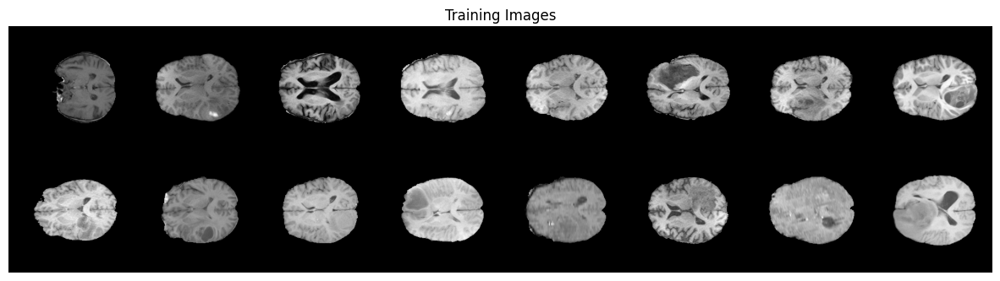

In [6]:
# Plot some training images
print(real_batch.shape)
# Actually plot it
plt.figure(figsize=(15, 15))
plt.axis("off")
plt.title("Training Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch.to(device)[:16], padding=2, normalize=True).cpu(),
        (1, 2, 0)
    )
)

In [7]:
def weight_init(m):
    """Custom weight initialization called on netG and netD"""
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.normal_(m.bias.data, 0)

In [8]:
# Generator code
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # state size: 100 * 1 * 1
            nn.ConvTranspose2d(100, 64, 4, 1, 0, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # state size: 64 * 4 * 4
            nn.ConvTranspose2d(64, 16, 4, 4, 0, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            # state size: 32 * 8 * 8
            # nn.ConvTranspose2d(32, 16, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(16),
            # nn.ReLU(True),
            # state size: 16 * 16 * 16
            nn.ConvTranspose2d(16, 4, 4, 4, 0, bias=False),
            nn.BatchNorm2d(4),
            nn.ReLU(True),
            # state size: 8 * 32 * 32
            # nn.ConvTranspose2d(8, 4, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(4),
            # nn.ReLU(True),
            # state size: 4 * 64 * 64
            nn.ConvTranspose2d(4, 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(2),
            nn.ReLU(True),
            # state size: 2 * 128 * 128
            nn.ConvTranspose2d(2, 1, 4, 2, 9, bias=False),
            nn.Tanh()
            # state size: 1 * 240 * 240
        )
    
    def forward(self, input):
        return self.main(input)

In [9]:
netG = Generator().to(device)
netG.apply(weight_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 64, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(64, 16, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(16, 4, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (7): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(4, 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(2, 1, kernel_size=(4, 4), stride=(2, 2), padding=(9, 9), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # state size: 1 * 240 * 240
            nn.Conv2d(1, 2, 4, 2, 9, bias=False),
            nn.BatchNorm2d(2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 2 * 128 * 128
            nn.Conv2d(2, 8, 4, 4, 0, bias=False),
            nn.BatchNorm2d(8),
            nn.LeakyReLU(0.2, inplace=True),
            # # state size: 4 * 64 * 64
            # nn.Conv2d(4, 8, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(8),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size: 8 * 32 * 32
            nn.Conv2d(8, 32, 4, 4, 0, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 16 * 16 * 16
            # nn.Conv2d(16, 32, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(32),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size: 32 * 8 * 8
            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 64 * 4 * 4
            nn.Conv2d(64, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # state size: 1 * 1 * 1
        )
    
    def forward(self, input):
        return self.main(input)

In [11]:
netD = Discriminator().to(device)
netD.apply(weight_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 2, kernel_size=(4, 4), stride=(2, 2), padding=(9, 9), bias=False)
    (1): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(2, 8, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(8, 32, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(64, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (13): Sig

In [12]:
critetion = nn.BCELoss()

fixed_noise = torch.randn(32, 100, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# Training loop

img_list = list()
G_losses = list()
D_losses = list()

print("Staring training loop...")
print(f"Number of iteration per epoch: {len(dataloader)}")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in dataloader
    for i, data in tqdm(enumerate(dataloader, 0)):
        # Update D network
        # maximize log(D(x)) using batch of real images
        # maximize log(1 - D(G(z))) using batch of fake images

        # Train with real batch
        netD.zero_grad()
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = critetion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Train with fake batch
        noise = torch.randn(b_size, 100, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = critetion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake

        optimizerD.step()

        # Train generator: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = critetion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 12 == 0:
            tqdm.write("\n".join((
                f"epoch: {epoch}/{num_epochs}, iter: {i}/{len(dataloader)}, Loss D: {errD.item()}, Loss G: {errG.item()}",
                f"D_x: {D_x:.4f}, D_G_z1: {D_G_z1:.4f}, D_G_z2: {D_G_z2:.4f}"
            )))
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (i % 12 == 0 or ((epoch == num_epochs - 1) and (i == len(dataloader) - 1))):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

Staring training loop...
Number of iteration per epoch: 24


0it [00:00, ?it/s]MIOpen(HIP): Warning [SQLiteBase] Missing system database file: gfx1030_14.kdb Performance may degrade. Please follow instructions to install: https://github.com/ROCmSoftwarePlatform/MIOpen#installing-miopen-kernels-package
0it [00:48, ?it/s]

epoch: 0/50, iter: 0/24, Loss D: 1.5004280805587769, Loss G: 1.0684289932250977
D_x: 0.3675, D_G_z1: 0.3751, D_G_z2: 0.3542


17it [00:49,  1.16s/it]

epoch: 0/50, iter: 12/24, Loss D: 0.24731099605560303, Loss G: 2.2585670948028564
D_x: 0.9125, D_G_z1: 0.1399, D_G_z2: 0.1128


24it [00:50,  2.11s/it]
4it [00:03,  1.33it/s]

epoch: 1/50, iter: 0/24, Loss D: 0.1353987455368042, Loss G: 2.772012710571289
D_x: 0.9507, D_G_z1: 0.0792, D_G_z2: 0.0666


15it [00:04,  7.35it/s]

epoch: 1/50, iter: 12/24, Loss D: 0.12510307133197784, Loss G: 2.893868923187256
D_x: 0.9582, D_G_z1: 0.0776, D_G_z2: 0.0601


24it [00:05,  4.51it/s]
0it [00:03, ?it/s]

epoch: 2/50, iter: 0/24, Loss D: 0.07060598582029343, Loss G: 3.3913216590881348
D_x: 0.9768, D_G_z1: 0.0455, D_G_z2: 0.0365


15it [00:04,  8.25it/s]

epoch: 2/50, iter: 12/24, Loss D: 0.05951101705431938, Loss G: 3.75468111038208
D_x: 0.9772, D_G_z1: 0.0349, D_G_z2: 0.0289


24it [00:05,  4.42it/s]
1it [00:03,  3.59s/it]

epoch: 3/50, iter: 0/24, Loss D: 0.038905952125787735, Loss G: 4.08632755279541
D_x: 0.9877, D_G_z1: 0.0260, D_G_z2: 0.0216


15it [00:04,  8.16it/s]

epoch: 3/50, iter: 12/24, Loss D: 0.03563607111573219, Loss G: 4.2304606437683105
D_x: 0.9891, D_G_z1: 0.0242, D_G_z2: 0.0200


24it [00:05,  4.56it/s]
4it [00:03,  1.34it/s]

epoch: 4/50, iter: 0/24, Loss D: 0.024241454899311066, Loss G: 4.805238246917725
D_x: 0.9883, D_G_z1: 0.0123, D_G_z2: 0.0111


16it [00:04,  8.07it/s]

epoch: 4/50, iter: 12/24, Loss D: 0.03272288292646408, Loss G: 4.610526084899902
D_x: 0.9835, D_G_z1: 0.0154, D_G_z2: 0.0150


24it [00:05,  4.50it/s]
1it [00:03,  3.81s/it]

epoch: 5/50, iter: 0/24, Loss D: 0.02604546770453453, Loss G: 4.776673793792725
D_x: 0.9887, D_G_z1: 0.0144, D_G_z2: 0.0112


13it [00:04,  5.91it/s]

epoch: 5/50, iter: 12/24, Loss D: 0.03838316351175308, Loss G: 4.275742530822754
D_x: 0.9865, D_G_z1: 0.0243, D_G_z2: 0.0184


24it [00:05,  4.43it/s]
0it [00:03, ?it/s]

epoch: 6/50, iter: 0/24, Loss D: 0.031952835619449615, Loss G: 4.3459696769714355
D_x: 0.9956, D_G_z1: 0.0267, D_G_z2: 0.0239


14it [00:04,  7.20it/s]

epoch: 6/50, iter: 12/24, Loss D: 0.01854211650788784, Loss G: 5.529227256774902
D_x: 0.9885, D_G_z1: 0.0069, D_G_z2: 0.0053


24it [00:05,  4.53it/s]
1it [00:03,  3.75s/it]

epoch: 7/50, iter: 0/24, Loss D: 0.02028985135257244, Loss G: 5.0317254066467285
D_x: 0.9946, D_G_z1: 0.0146, D_G_z2: 0.0104


16it [00:04,  8.14it/s]

epoch: 7/50, iter: 12/24, Loss D: 0.015857528895139694, Loss G: 5.359092712402344
D_x: 0.9952, D_G_z1: 0.0109, D_G_z2: 0.0083


24it [00:05,  4.43it/s]
1it [00:03,  3.61s/it]

epoch: 8/50, iter: 0/24, Loss D: 0.015824424102902412, Loss G: 5.408358573913574
D_x: 0.9936, D_G_z1: 0.0092, D_G_z2: 0.0077


16it [00:04,  9.77it/s]

epoch: 8/50, iter: 12/24, Loss D: 0.013398414477705956, Loss G: 5.634023189544678
D_x: 0.9943, D_G_z1: 0.0077, D_G_z2: 0.0059


24it [00:05,  4.54it/s]
4it [00:03,  1.41it/s]

epoch: 9/50, iter: 0/24, Loss D: 0.011354866437613964, Loss G: 6.074319839477539
D_x: 0.9921, D_G_z1: 0.0034, D_G_z2: 0.0036


16it [00:04,  8.60it/s]

epoch: 9/50, iter: 12/24, Loss D: 0.012665117159485817, Loss G: 5.819124221801758
D_x: 0.9934, D_G_z1: 0.0059, D_G_z2: 0.0041


24it [00:05,  4.61it/s]
0it [00:03, ?it/s]

epoch: 10/50, iter: 0/24, Loss D: 0.015456588938832283, Loss G: 5.616053581237793
D_x: 0.9936, D_G_z1: 0.0089, D_G_z2: 0.0065


16it [00:04, 10.24it/s]

epoch: 10/50, iter: 12/24, Loss D: 0.01186799444258213, Loss G: 5.903413772583008
D_x: 0.9960, D_G_z1: 0.0078, D_G_z2: 0.0050


24it [00:05,  4.52it/s]
4it [00:03,  1.36it/s]

epoch: 11/50, iter: 0/24, Loss D: 0.4000603258609772, Loss G: 1.3465471267700195
D_x: 0.7140, D_G_z1: 0.0006, D_G_z2: 0.4333


14it [00:04,  7.45it/s]

epoch: 11/50, iter: 12/24, Loss D: 0.03172171860933304, Loss G: 4.442189693450928
D_x: 0.9927, D_G_z1: 0.0238, D_G_z2: 0.0160


24it [00:05,  4.53it/s]
1it [00:03,  3.77s/it]

epoch: 12/50, iter: 0/24, Loss D: 0.022124769166111946, Loss G: 4.820427417755127
D_x: 0.9932, D_G_z1: 0.0151, D_G_z2: 0.0114


16it [00:04,  8.10it/s]

epoch: 12/50, iter: 12/24, Loss D: 0.03148159384727478, Loss G: 5.02579402923584
D_x: 0.9866, D_G_z1: 0.0175, D_G_z2: 0.0108


24it [00:05,  4.51it/s]
4it [00:04,  1.29it/s]

epoch: 13/50, iter: 0/24, Loss D: 0.08238875865936279, Loss G: 4.293975353240967
D_x: 0.9717, D_G_z1: 0.0486, D_G_z2: 0.0173


16it [00:04,  8.02it/s]

epoch: 13/50, iter: 12/24, Loss D: 0.06652846932411194, Loss G: 5.201322555541992
D_x: 0.9834, D_G_z1: 0.0448, D_G_z2: 0.0116


24it [00:05,  4.42it/s]
0it [00:03, ?it/s]

epoch: 14/50, iter: 0/24, Loss D: 0.054740384221076965, Loss G: 5.618668556213379
D_x: 0.9538, D_G_z1: 0.0057, D_G_z2: 0.0068


16it [00:04, 10.32it/s]

epoch: 14/50, iter: 12/24, Loss D: 0.030350511893630028, Loss G: 5.173103332519531
D_x: 0.9842, D_G_z1: 0.0138, D_G_z2: 0.0119


24it [00:05,  4.50it/s]
0it [00:03, ?it/s]

epoch: 15/50, iter: 0/24, Loss D: 0.2352159470319748, Loss G: 6.070873260498047
D_x: 0.9951, D_G_z1: 0.1722, D_G_z2: 0.0042


14it [00:04,  7.36it/s]

epoch: 15/50, iter: 12/24, Loss D: 0.06223707273602486, Loss G: 5.072192192077637
D_x: 0.9516, D_G_z1: 0.0075, D_G_z2: 0.0115


24it [00:05,  4.45it/s]
0it [00:03, ?it/s]

epoch: 16/50, iter: 0/24, Loss D: 3.2491767406463623, Loss G: 2.2771928310394287
D_x: 0.0759, D_G_z1: 0.0002, D_G_z2: 0.1587


13it [00:04,  7.02it/s]

epoch: 16/50, iter: 12/24, Loss D: 0.06144869327545166, Loss G: 4.9937543869018555
D_x: 0.9605, D_G_z1: 0.0196, D_G_z2: 0.0089


24it [00:05,  4.53it/s]
1it [00:03,  3.66s/it]

epoch: 17/50, iter: 0/24, Loss D: 0.15462709963321686, Loss G: 4.404049396514893
D_x: 0.8738, D_G_z1: 0.0054, D_G_z2: 0.0160


10it [00:04,  4.46it/s]

epoch: 17/50, iter: 12/24, Loss D: 0.0913432314991951, Loss G: 5.659914970397949
D_x: 0.9682, D_G_z1: 0.0535, D_G_z2: 0.0053


24it [00:05,  4.48it/s]
0it [00:02, ?it/s]

epoch: 18/50, iter: 0/24, Loss D: 3.073380947113037, Loss G: 0.7574394941329956
D_x: 0.0625, D_G_z1: 0.0001, D_G_z2: 0.5687


15it [00:03,  8.86it/s]

epoch: 18/50, iter: 12/24, Loss D: 0.05317902937531471, Loss G: 4.21513557434082
D_x: 0.9892, D_G_z1: 0.0408, D_G_z2: 0.0196


24it [00:04,  4.98it/s]
0it [00:02, ?it/s]

epoch: 19/50, iter: 0/24, Loss D: 0.15531456470489502, Loss G: 3.406871795654297
D_x: 0.9644, D_G_z1: 0.1081, D_G_z2: 0.0438


16it [00:03,  8.95it/s]

epoch: 19/50, iter: 12/24, Loss D: 0.24636554718017578, Loss G: 3.763916254043579
D_x: 0.9832, D_G_z1: 0.1902, D_G_z2: 0.0416


24it [00:05,  4.78it/s]
1it [00:03,  3.73s/it]

epoch: 20/50, iter: 0/24, Loss D: 1.25455641746521, Loss G: 4.066069602966309
D_x: 0.4056, D_G_z1: 0.0021, D_G_z2: 0.0313


16it [00:04,  8.33it/s]

epoch: 20/50, iter: 12/24, Loss D: 0.13101577758789062, Loss G: 4.087052822113037
D_x: 0.9132, D_G_z1: 0.0302, D_G_z2: 0.0341


24it [00:05,  4.56it/s]
0it [00:03, ?it/s]

epoch: 21/50, iter: 0/24, Loss D: 0.21124152839183807, Loss G: 4.23149299621582
D_x: 0.8307, D_G_z1: 0.0122, D_G_z2: 0.0197


14it [00:04,  7.34it/s]

epoch: 21/50, iter: 12/24, Loss D: 0.270683228969574, Loss G: 3.4344820976257324
D_x: 0.9346, D_G_z1: 0.1730, D_G_z2: 0.0486


24it [00:05,  4.44it/s]
4it [00:03,  1.39it/s]

epoch: 22/50, iter: 0/24, Loss D: 0.1283683478832245, Loss G: 3.9735336303710938
D_x: 0.9493, D_G_z1: 0.0667, D_G_z2: 0.0237


16it [00:04,  8.25it/s]

epoch: 22/50, iter: 12/24, Loss D: 0.20103785395622253, Loss G: 3.956205368041992
D_x: 0.9017, D_G_z1: 0.0752, D_G_z2: 0.0379


24it [00:05,  4.49it/s]
4it [00:03,  1.38it/s]

epoch: 23/50, iter: 0/24, Loss D: 0.22164152562618256, Loss G: 2.69866943359375
D_x: 0.8660, D_G_z1: 0.0658, D_G_z2: 0.1016


16it [00:04,  8.32it/s]

epoch: 23/50, iter: 12/24, Loss D: 0.17955070734024048, Loss G: 3.4154915809631348
D_x: 0.9594, D_G_z1: 0.1229, D_G_z2: 0.0451


24it [00:05,  4.57it/s]
0it [00:03, ?it/s]

epoch: 24/50, iter: 0/24, Loss D: 4.558075904846191, Loss G: 3.039119005203247
D_x: 0.0126, D_G_z1: 0.0002, D_G_z2: 0.0721


15it [00:04,  8.27it/s]

epoch: 24/50, iter: 12/24, Loss D: 0.22377216815948486, Loss G: 2.99107027053833
D_x: 0.8727, D_G_z1: 0.0759, D_G_z2: 0.0665


24it [00:05,  4.49it/s]
1it [00:03,  3.65s/it]

epoch: 25/50, iter: 0/24, Loss D: 0.20888127386569977, Loss G: 3.8817667961120605
D_x: 0.8997, D_G_z1: 0.0898, D_G_z2: 0.0365


15it [00:04,  8.58it/s]

epoch: 25/50, iter: 12/24, Loss D: 0.1582050621509552, Loss G: 3.2739951610565186
D_x: 0.9516, D_G_z1: 0.0981, D_G_z2: 0.0526


24it [00:05,  4.48it/s]
0it [00:03, ?it/s]

epoch: 26/50, iter: 0/24, Loss D: 0.18943412601947784, Loss G: 2.9836742877960205
D_x: 0.9868, D_G_z1: 0.1548, D_G_z2: 0.0661


14it [00:04,  7.99it/s]

epoch: 26/50, iter: 12/24, Loss D: 0.2805715501308441, Loss G: 2.615283489227295
D_x: 0.8020, D_G_z1: 0.0378, D_G_z2: 0.1077


24it [00:05,  4.61it/s]
4it [00:03,  1.43it/s]

epoch: 27/50, iter: 0/24, Loss D: 0.7501382827758789, Loss G: 1.5259138345718384
D_x: 0.5273, D_G_z1: 0.0017, D_G_z2: 0.3128


15it [00:04,  8.22it/s]

epoch: 27/50, iter: 12/24, Loss D: 0.23492419719696045, Loss G: 2.682739734649658
D_x: 0.8420, D_G_z1: 0.0502, D_G_z2: 0.0748


24it [00:05,  4.62it/s]
0it [00:03, ?it/s]

epoch: 28/50, iter: 0/24, Loss D: 0.927228569984436, Loss G: 1.2764450311660767
D_x: 0.4483, D_G_z1: 0.0159, D_G_z2: 0.3511


14it [00:04,  7.85it/s]

epoch: 28/50, iter: 12/24, Loss D: 0.3087675869464874, Loss G: 2.8803658485412598
D_x: 0.8787, D_G_z1: 0.1424, D_G_z2: 0.0791


24it [00:05,  4.44it/s]
0it [00:03, ?it/s]

epoch: 29/50, iter: 0/24, Loss D: 1.629135012626648, Loss G: 3.67590594291687
D_x: 0.9780, D_G_z1: 0.7411, D_G_z2: 0.0347


15it [00:04,  8.88it/s]

epoch: 29/50, iter: 12/24, Loss D: 0.2575432062149048, Loss G: 2.906424045562744
D_x: 0.8371, D_G_z1: 0.0610, D_G_z2: 0.0708


24it [00:05,  4.45it/s]
3it [00:03,  1.03it/s]

epoch: 30/50, iter: 0/24, Loss D: 0.28519898653030396, Loss G: 2.461597442626953
D_x: 0.8392, D_G_z1: 0.0901, D_G_z2: 0.1094


16it [00:04,  9.93it/s]

epoch: 30/50, iter: 12/24, Loss D: 0.3025471866130829, Loss G: 3.1318020820617676
D_x: 0.9498, D_G_z1: 0.2113, D_G_z2: 0.0543


24it [00:05,  4.53it/s]
1it [00:03,  3.57s/it]

epoch: 31/50, iter: 0/24, Loss D: 0.6634818911552429, Loss G: 3.594339370727539
D_x: 0.9787, D_G_z1: 0.4404, D_G_z2: 0.0355


16it [00:04,  8.58it/s]

epoch: 31/50, iter: 12/24, Loss D: 0.2508269250392914, Loss G: 2.613631248474121
D_x: 0.8379, D_G_z1: 0.0672, D_G_z2: 0.0923


24it [00:05,  4.47it/s]
1it [00:03,  3.54s/it]

epoch: 32/50, iter: 0/24, Loss D: 0.21043899655342102, Loss G: 3.897796154022217
D_x: 0.8322, D_G_z1: 0.0189, D_G_z2: 0.0329


15it [00:04,  7.99it/s]

epoch: 32/50, iter: 12/24, Loss D: 0.19896376132965088, Loss G: 3.4476161003112793
D_x: 0.9149, D_G_z1: 0.0984, D_G_z2: 0.0473


24it [00:05,  4.56it/s]
1it [00:03,  3.67s/it]

epoch: 33/50, iter: 0/24, Loss D: 2.1045427322387695, Loss G: 1.2192329168319702
D_x: 0.9966, D_G_z1: 0.8477, D_G_z2: 0.3265


16it [00:04,  8.26it/s]

epoch: 33/50, iter: 12/24, Loss D: 0.31986498832702637, Loss G: 2.565284252166748
D_x: 0.8632, D_G_z1: 0.1379, D_G_z2: 0.1127


24it [00:05,  4.50it/s]
0it [00:03, ?it/s]

epoch: 34/50, iter: 0/24, Loss D: 0.613602340221405, Loss G: 2.396113872528076
D_x: 0.9434, D_G_z1: 0.3850, D_G_z2: 0.1230


15it [00:04,  8.19it/s]

epoch: 34/50, iter: 12/24, Loss D: 0.33427494764328003, Loss G: 2.2808492183685303
D_x: 0.9100, D_G_z1: 0.2048, D_G_z2: 0.1151


24it [00:05,  4.52it/s]
0it [00:03, ?it/s]

epoch: 35/50, iter: 0/24, Loss D: 0.4340563416481018, Loss G: 2.317117691040039
D_x: 0.9690, D_G_z1: 0.3153, D_G_z2: 0.1156


16it [00:04,  9.68it/s]

epoch: 35/50, iter: 12/24, Loss D: 0.23029688000679016, Loss G: 2.740203380584717
D_x: 0.9231, D_G_z1: 0.1340, D_G_z2: 0.0774


24it [00:05,  4.46it/s]
0it [00:03, ?it/s]

epoch: 36/50, iter: 0/24, Loss D: 0.6926199197769165, Loss G: 2.4982500076293945
D_x: 0.9797, D_G_z1: 0.4500, D_G_z2: 0.1049


16it [00:04,  8.26it/s]

epoch: 36/50, iter: 12/24, Loss D: 0.37193965911865234, Loss G: 2.6008434295654297
D_x: 0.9141, D_G_z1: 0.2260, D_G_z2: 0.1006


24it [00:05,  4.58it/s]
3it [00:03,  1.00s/it]

epoch: 37/50, iter: 0/24, Loss D: 0.2855077385902405, Loss G: 2.4923994541168213
D_x: 0.9249, D_G_z1: 0.1753, D_G_z2: 0.1048


14it [00:04,  7.21it/s]

epoch: 37/50, iter: 12/24, Loss D: 0.34765225648880005, Loss G: 1.894655704498291
D_x: 0.8508, D_G_z1: 0.1622, D_G_z2: 0.1660


24it [00:05,  4.40it/s]
0it [00:03, ?it/s]

epoch: 38/50, iter: 0/24, Loss D: 0.9405241012573242, Loss G: 2.2745518684387207
D_x: 0.9788, D_G_z1: 0.5262, D_G_z2: 0.1311


16it [00:04,  9.73it/s]

epoch: 38/50, iter: 12/24, Loss D: 0.28310275077819824, Loss G: 2.5024991035461426
D_x: 0.8805, D_G_z1: 0.1337, D_G_z2: 0.0947


24it [00:05,  4.46it/s]
0it [00:03, ?it/s]

epoch: 39/50, iter: 0/24, Loss D: 0.4197967052459717, Loss G: 2.2337961196899414
D_x: 0.9202, D_G_z1: 0.2715, D_G_z2: 0.1389


15it [00:04,  8.31it/s]

epoch: 39/50, iter: 12/24, Loss D: 0.557447075843811, Loss G: 1.7529432773590088
D_x: 0.6484, D_G_z1: 0.0621, D_G_z2: 0.2072


24it [00:05,  4.52it/s]
0it [00:03, ?it/s]

epoch: 40/50, iter: 0/24, Loss D: 0.7397519946098328, Loss G: 2.4120850563049316
D_x: 0.9844, D_G_z1: 0.4490, D_G_z2: 0.1559


14it [00:04,  7.20it/s]

epoch: 40/50, iter: 12/24, Loss D: 0.3810117840766907, Loss G: 2.4126148223876953
D_x: 0.9435, D_G_z1: 0.2669, D_G_z2: 0.1012


24it [00:05,  4.42it/s]
1it [00:03,  3.47s/it]

epoch: 41/50, iter: 0/24, Loss D: 0.6141378879547119, Loss G: 2.7769665718078613
D_x: 0.9854, D_G_z1: 0.3619, D_G_z2: 0.1197


14it [00:04,  8.31it/s]

epoch: 41/50, iter: 12/24, Loss D: 0.25237536430358887, Loss G: 2.647604465484619
D_x: 0.9243, D_G_z1: 0.1487, D_G_z2: 0.1012


24it [00:05,  4.40it/s]
1it [00:03,  3.68s/it]

epoch: 42/50, iter: 0/24, Loss D: 0.2800346314907074, Loss G: 2.623575448989868
D_x: 0.9134, D_G_z1: 0.1643, D_G_z2: 0.0930


16it [00:04,  8.22it/s]

epoch: 42/50, iter: 12/24, Loss D: 0.4114986062049866, Loss G: 2.0743064880371094
D_x: 0.8484, D_G_z1: 0.2069, D_G_z2: 0.1444


24it [00:05,  4.49it/s]
0it [00:03, ?it/s]

epoch: 43/50, iter: 0/24, Loss D: 2.4449946880340576, Loss G: 2.667595386505127
D_x: 0.9945, D_G_z1: 0.8956, D_G_z2: 0.0801


16it [00:04,  9.80it/s]

epoch: 43/50, iter: 12/24, Loss D: 0.237776517868042, Loss G: 2.639791488647461
D_x: 0.9423, D_G_z1: 0.1498, D_G_z2: 0.0967


24it [00:05,  4.43it/s]
1it [00:03,  3.76s/it]

epoch: 44/50, iter: 0/24, Loss D: 0.8771053552627563, Loss G: 2.250375747680664
D_x: 0.9846, D_G_z1: 0.5413, D_G_z2: 0.1222


15it [00:04,  7.92it/s]

epoch: 44/50, iter: 12/24, Loss D: 0.2765269875526428, Loss G: 2.716160535812378
D_x: 0.8421, D_G_z1: 0.0881, D_G_z2: 0.0823


24it [00:05,  4.42it/s]
0it [00:03, ?it/s]

epoch: 45/50, iter: 0/24, Loss D: 0.14304150640964508, Loss G: 2.966557025909424
D_x: 0.9296, D_G_z1: 0.0642, D_G_z2: 0.0693


15it [00:04,  8.06it/s]

epoch: 45/50, iter: 12/24, Loss D: 0.329397976398468, Loss G: 2.584313154220581
D_x: 0.8940, D_G_z1: 0.1847, D_G_z2: 0.1009


24it [00:05,  4.46it/s]
0it [00:03, ?it/s]

epoch: 46/50, iter: 0/24, Loss D: 0.2750108242034912, Loss G: 6.013150215148926
D_x: 0.9799, D_G_z1: 0.2071, D_G_z2: 0.0055


16it [00:04, 10.33it/s]

epoch: 46/50, iter: 12/24, Loss D: 0.18315811455249786, Loss G: 3.5685391426086426
D_x: 0.8897, D_G_z1: 0.0592, D_G_z2: 0.0341


24it [00:05,  4.46it/s]
0it [00:03, ?it/s]

epoch: 47/50, iter: 0/24, Loss D: 1.1327409744262695, Loss G: 1.574715495109558
D_x: 0.9832, D_G_z1: 0.6274, D_G_z2: 0.2515


16it [00:04,  8.19it/s]

epoch: 47/50, iter: 12/24, Loss D: 0.22950023412704468, Loss G: 2.6181230545043945
D_x: 0.8857, D_G_z1: 0.0986, D_G_z2: 0.0864


24it [00:05,  4.47it/s]
4it [00:03,  1.39it/s]

epoch: 48/50, iter: 0/24, Loss D: 0.3330800533294678, Loss G: 2.107954502105713
D_x: 0.9723, D_G_z1: 0.2400, D_G_z2: 0.1768


15it [00:04,  7.62it/s]

epoch: 48/50, iter: 12/24, Loss D: 0.42946937680244446, Loss G: 1.9752652645111084
D_x: 0.8832, D_G_z1: 0.2400, D_G_z2: 0.1706


24it [00:05,  4.52it/s]
4it [00:03,  1.37it/s]

epoch: 49/50, iter: 0/24, Loss D: 0.17768558859825134, Loss G: 2.5526013374328613
D_x: 0.9340, D_G_z1: 0.1014, D_G_z2: 0.0884


16it [00:04,  8.39it/s]

epoch: 49/50, iter: 12/24, Loss D: 0.26662397384643555, Loss G: 2.371159076690674
D_x: 0.9017, D_G_z1: 0.1409, D_G_z2: 0.1127


24it [00:05,  4.42it/s]


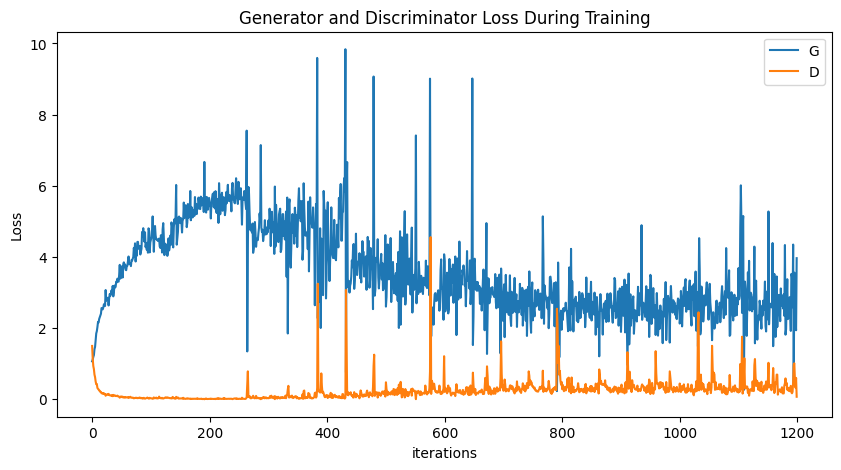

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

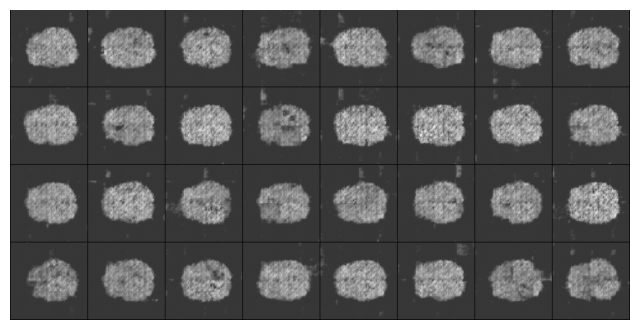

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[-50:]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

(-0.5, 1937.5, 969.5, -0.5)

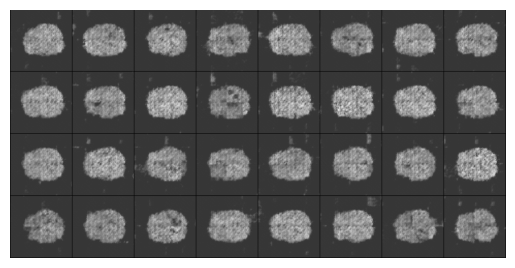

In [16]:
plt.imshow(
    np.transpose(
        img_list[-1],
        (1, 2, 0)
    )
)
plt.axis("off")

In [17]:
# Save models weights
torch.save(netD.state_dict(), "models/dcgan_09_58_29_11/discriminator.pth")
torch.save(netG.state_dict(), "models/dcgan_09_58_29_11/generator.pth")

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 2, kernel_size=(4, 4), stride=(2, 2), padding=(9, 9), bias=False)
    (1): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(2, 8, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(8, 32, kernel_size=(4, 4), stride=(4, 4), bias=False)
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(64, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (13): Sig

(-0.5, 239.5, 239.5, -0.5)

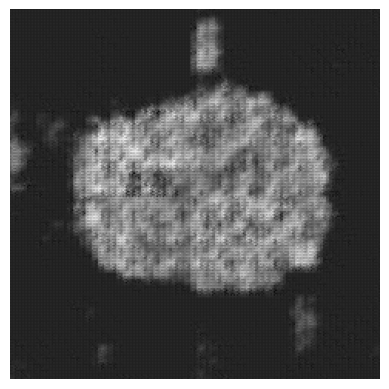

In [20]:
# Load model and perform inference
netD = Discriminator().to(device)
netD.apply(weight_init)
print(netD)

netG = Generator().to(device)
netG.apply(weight_init)
print(netG)

netD.load_state_dict(torch.load("models/dcgan_09_58_29_11/discriminator.pth"))
netG.load_state_dict(torch.load("models/dcgan_09_58_29_11/generator.pth"))

netG.eval()

fixed_noise = torch.randn(32, 100, 1, 1, device=device)

fake = netG(noise).detach().cpu()

plt.imshow(
    np.transpose(
        vutils.make_grid(fake, padding=2, normalize=True),
        (1, 2, 0)
    )
)
plt.axis("off")